In [1]:
import numpy as np 
import pandas as pd
import cv2 
from matplotlib import pyplot as plt 
from pylab import imread
from skimage.color import rgb2gray

In [2]:
def imshows(ImageData, LabelData, rows, cols, gridType = False):
  # Convert ImageData and LabelData to List
  from matplotlib import pyplot as plt
  ImageArray = list(ImageData)
  LabelArray = list(LabelData)
  if(rows == 1 & cols == 1):
    fig = plt.figure(figsize=(20,20))
  else:
    fig = plt.figure(figsize=(cols*8,rows*5))
        
  for i in range(1, cols * rows + 1):
      fig.add_subplot(rows, cols, i)
      image = ImageArray[i - 1]
      # If the channel number is less than 3, we display as grayscale image
      # otherwise, we display as color image
      if (len(image.shape) < 3):
          plt.imshow(image, plt.cm.gray)
          plt.grid(gridType)
      else:
          plt.imshow(image)
          plt.grid(gridType)
      plt.title(LabelArray[i - 1])
  plt.show()

def ShowThreeImages(IM1, IM2, IM3):
    imshows([IM1, IM2, IM3], ["Image 1","Image 2", "Image 3"], 1, 3)
def ShowTwoImages(IM1, IM2):
    imshows([IM1, IM2], ["Image 1","Image 2"], 1, 2)
def ShowOneImage(IM):
    imshows([IM], ["Image"], 1, 1)
def ShowListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
    imshows(listImage,listCaption,row,col)

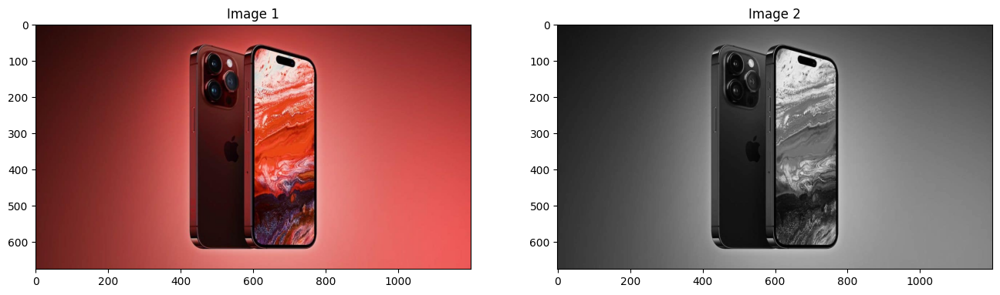

In [14]:
# Read Image 
image_color = imread("iPhone-15-Pro-red-color.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
ShowTwoImages(image_color, image_gray)

In [4]:
# Show Information of Color Image
Image = image_color.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())  

Width :  1200  Height :  675  Channel :  3
Red - Min Intensity:  0  Max Intensity:  255
Green - Min Intensity:  0  Max Intensity:  254
Blue - Min Intensity:  0  Max Intensity:  249


In [5]:
# Show Information of Gray Image
Image = image_gray.copy()
Width = Image.shape[1]
Height = Image.shape[0]
Channel = len(Image.shape)
print("Width : ", Width, " Height : ", Height, " Channel : ", Channel)

IM = image_color.copy
if(Channel == 2):
    print("Min Intensity: ", Image.min(), " Max Intensity: ", Image.max())
else:
    print("Red - Min Intensity: ", Image[:,:,0].min(), " Max Intensity: ", Image[:,:,0].max())
    print("Green - Min Intensity: ", Image[:,:,1].min(), " Max Intensity: ", Image[:,:,1].max())
    print("Blue - Min Intensity: ", Image[:,:,2].min(), " Max Intensity: ", Image[:,:,2].max())      

Width :  1200  Height :  675  Channel :  2
Min Intensity:  0  Max Intensity:  253


In [6]:
def intToBitArray(img) :
    row ,col = img.shape
    list = []
    for i in range(row):
        for j in range(col):
             list.append (np.binary_repr( img[i][j] ,width=8  ) )
    return list #the binary_repr() fucntion returns binary values but in 
                #string 
                #, not integer, which has it's own perk as you will notice 
def bitplane(bitImgVal , img1D ):
    bitList = [  int(   i[bitImgVal]  )    for i in img1D]
    return bitList
def GetBitImage(index, image2D):
    ImageIn1D = intToBitArray(image2D)
    Imagebit = np.array( bitplane(index, ImageIn1D ) )
    Imagebit = np.reshape(Imagebit , image2D.shape )
    return Imagebit
def GetAllBitImage(image2D):
    image2D_Bit = list()
    for i in range(8):
        image2D_Bit.append(GetBitImage(i, image2D))
    return image2D_Bit

List have  24  images


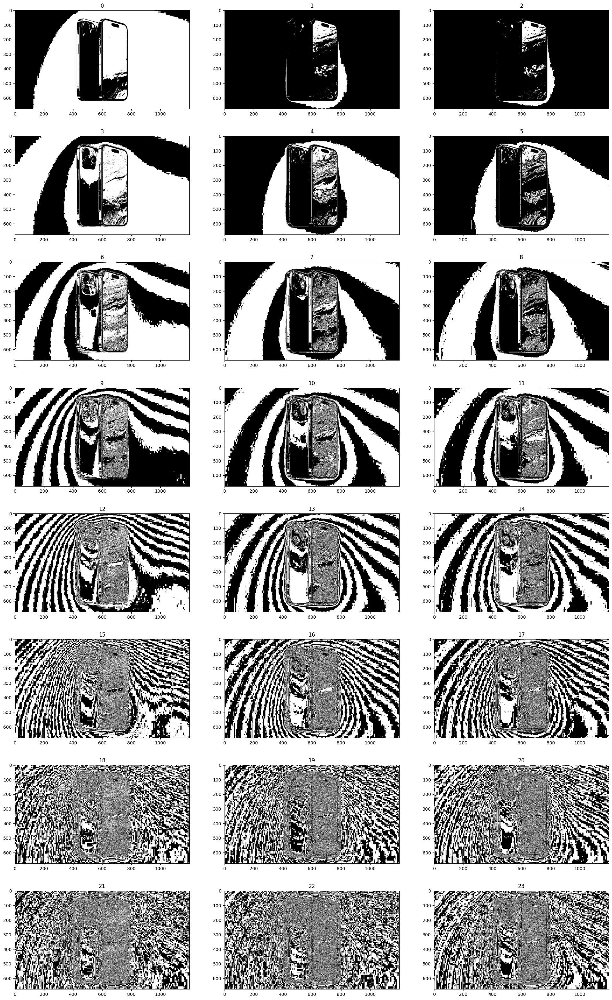

In [28]:
# Lấy danh sách ảnh bit theo kênh màu R, G, B
image2D_Bit_R = GetAllBitImage(image_color[:,:,0])
image2D_Bit_G = GetAllBitImage(image_color[:,:,1])
image2D_Bit_B = GetAllBitImage(image_color[:,:,2])

# Hiển thị 24 ảnh bit
image2D_Bit = []
for i in range(8):
    image2D_Bit.append(image2D_Bit_R[i])
    image2D_Bit.append(image2D_Bit_G[i])
    image2D_Bit.append(image2D_Bit_B[i])
    
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 8, 3)

List have  24  images


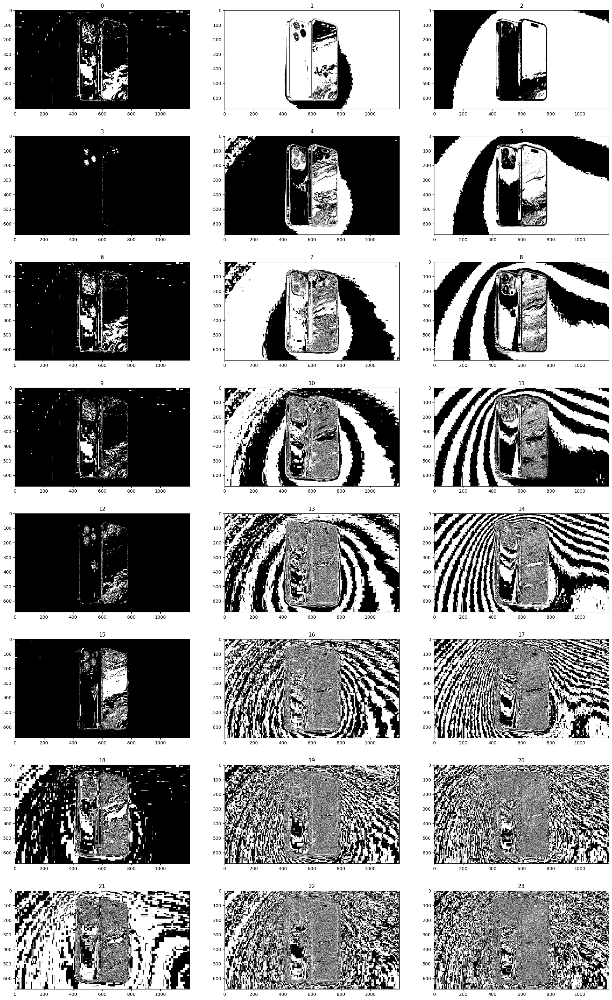

In [29]:
# Chuyển ảnh sang không gian màu HSV
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)

# Lấy danh sách ảnh bit theo kênh màu H, S, V
image2D_Bit_H = GetAllBitImage(image_hsv[:,:,0])
image2D_Bit_S = GetAllBitImage(image_hsv[:,:,1])
image2D_Bit_V = GetAllBitImage(image_hsv[:,:,2])

# Hiển thị 24 ảnh bit
image2D_Bit = []
for i in range(8):
    image2D_Bit.append(image2D_Bit_H[i])
    image2D_Bit.append(image2D_Bit_S[i])
    image2D_Bit.append(image2D_Bit_V[i])
    
print("List have ", len(image2D_Bit), " images")
ShowListImages(image2D_Bit, 8, 3)


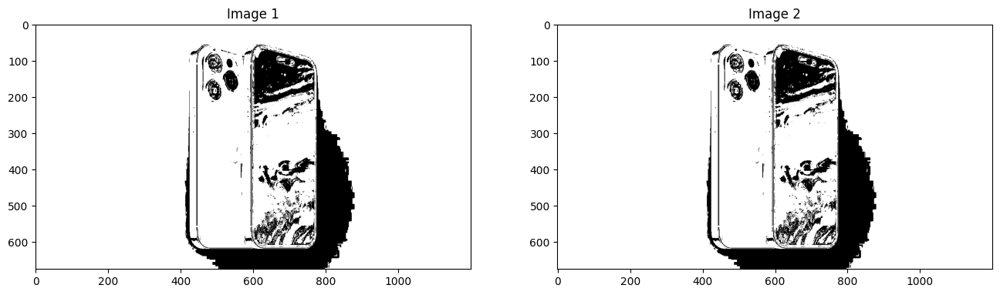

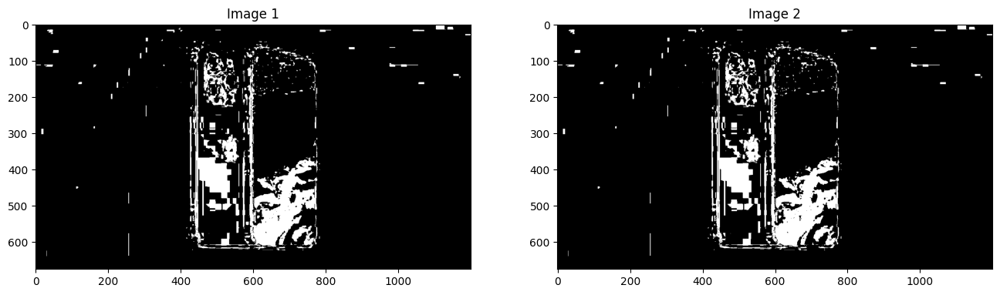

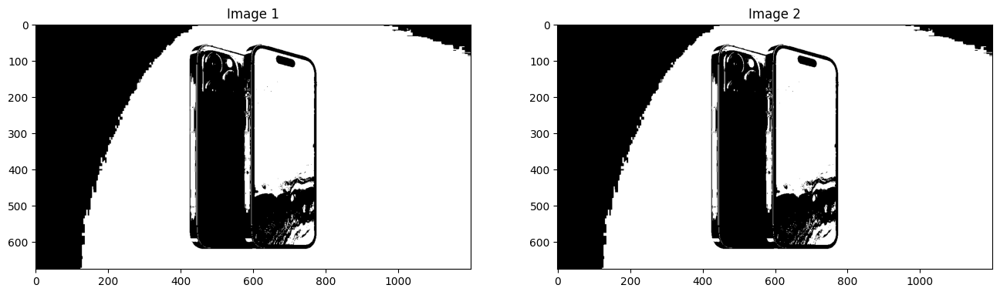

In [30]:
 ##Bit images can detect the object
ChannelG = image2D_Bit[1]
ChannelV = image2D_Bit[1]
ShowTwoImages(ChannelG, ChannelV)
ChannelG = image2D_Bit[0]
ChannelV = image2D_Bit[0]
ShowTwoImages(ChannelG, ChannelV)
ChannelG = image2D_Bit[2]
ChannelV = image2D_Bit[2]
ShowTwoImages(ChannelG, ChannelV)


Image Size: (432, 650, 3)


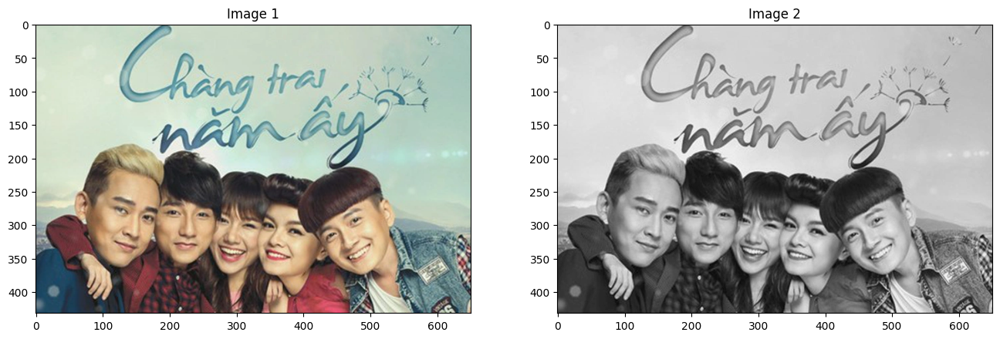

In [31]:
# Read Image 
image_color = imread("hinh-anh-chang-trai-nam-ay-27-1415691014146-crop-1415691023171.webp")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

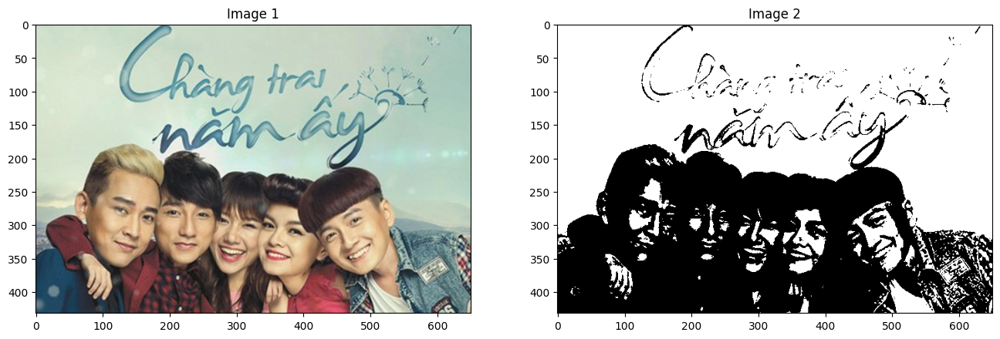

In [32]:
# Get color by range color in RGB from [0,0,150] to [255,255,255]
lower = np.array([0,0,150])
upper = np.array([255,255,255])
CellMask02 = cv2.inRange(image_color, lower, upper)
ShowTwoImages(image_color, CellMask02)

Image Size: (1144, 1144, 3)


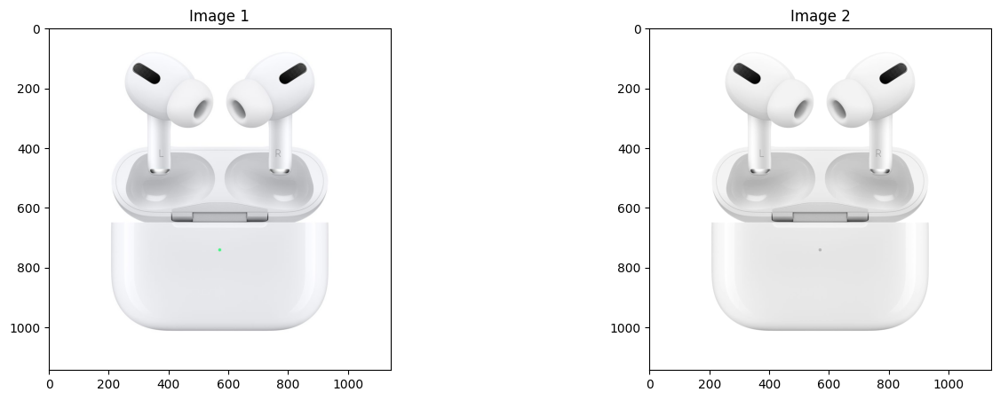

In [33]:
# Read Image 
image_color = imread("MWP22.jpg")
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
print("Image Size:", image_color.shape)
ShowTwoImages(image_color, image_gray)

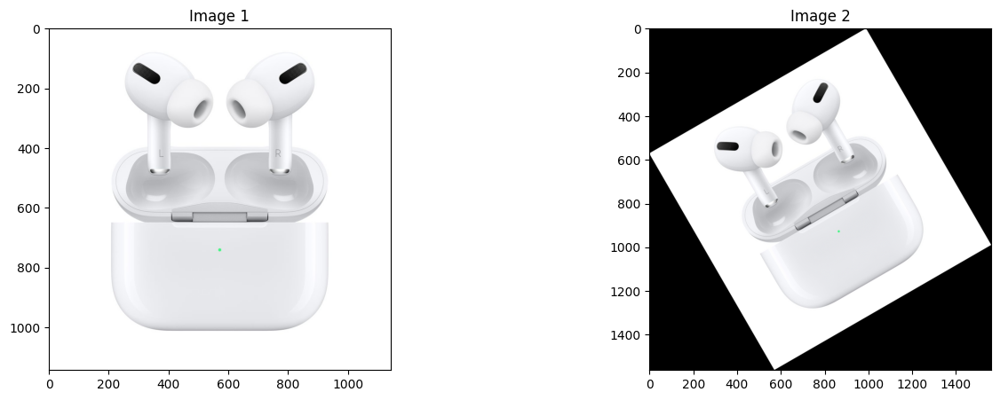

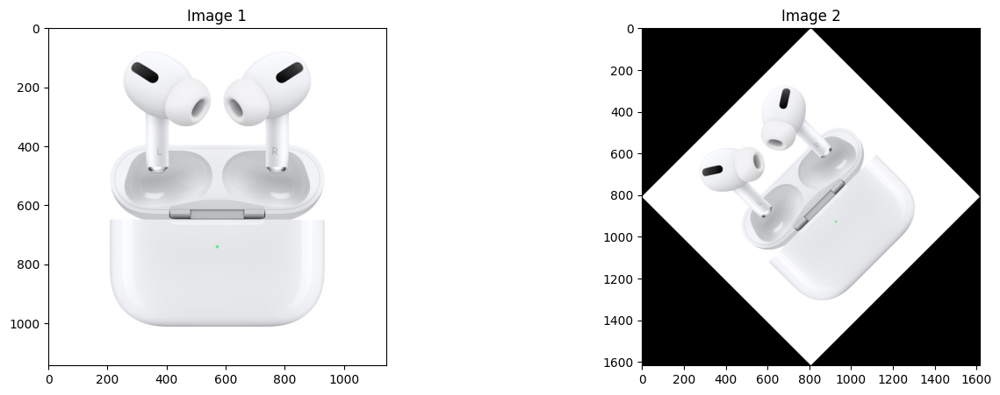

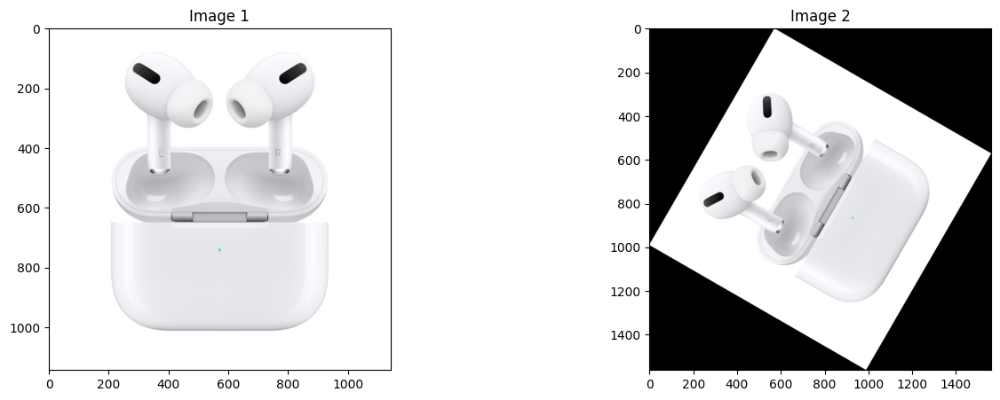

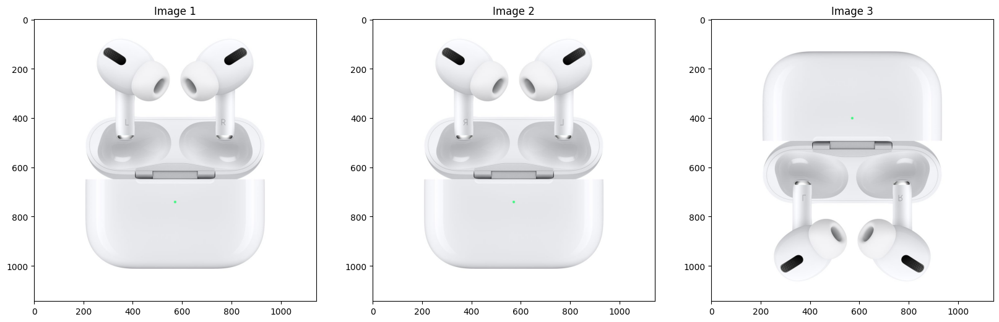

In [35]:
from skimage.transform import rotate
image_color_rotate_30_01 = rotate(image_color, 30, resize=True)
ShowTwoImages(image_color,image_color_rotate_30_01)

image_color_rotate_45 = rotate(image_color, 45, resize=True)
ShowTwoImages(image_color, image_color_rotate_45)

image_color_rotate_60 = rotate(image_color, 60, resize=True)
ShowTwoImages(image_color, image_color_rotate_60)

image_color_horizontal_flip = image_color[:, ::-1]
image_color_vertical_flip = image_color[::-1, :]

ShowThreeImages(image_color, image_color_horizontal_flip,image_color_vertical_flip)

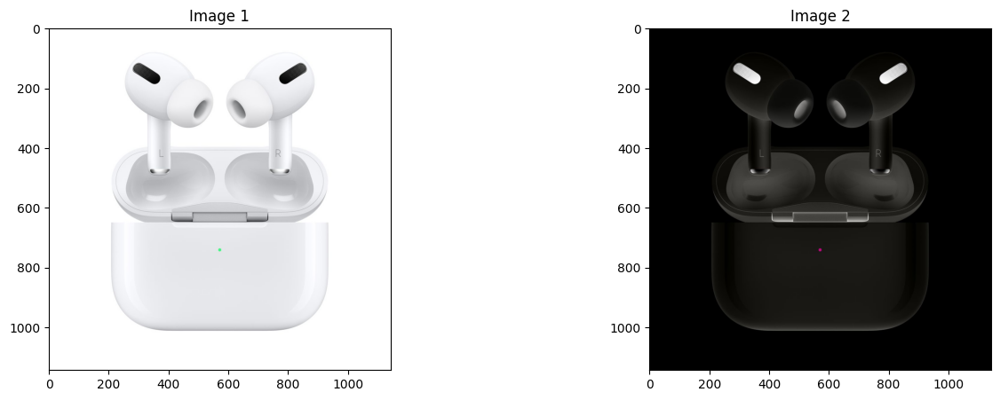

In [36]:
from skimage import util
image_color_inversion = util.invert(image_color)
ShowTwoImages(image_color, image_color_inversion)

216.0 255.0


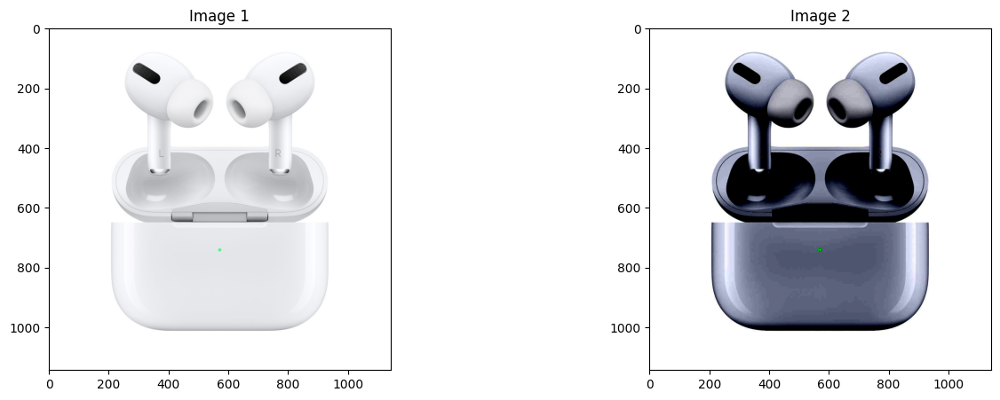

In [37]:
import numpy as np
from skimage import exposure

# take from 10 to 90 percent of color range
v_min, v_max = np.percentile(image_color, (10, 90))
better_contrast = exposure.rescale_intensity(image_color, in_range=(v_min, v_max))

print(v_min, v_max)
ShowTwoImages(image_color, better_contrast)

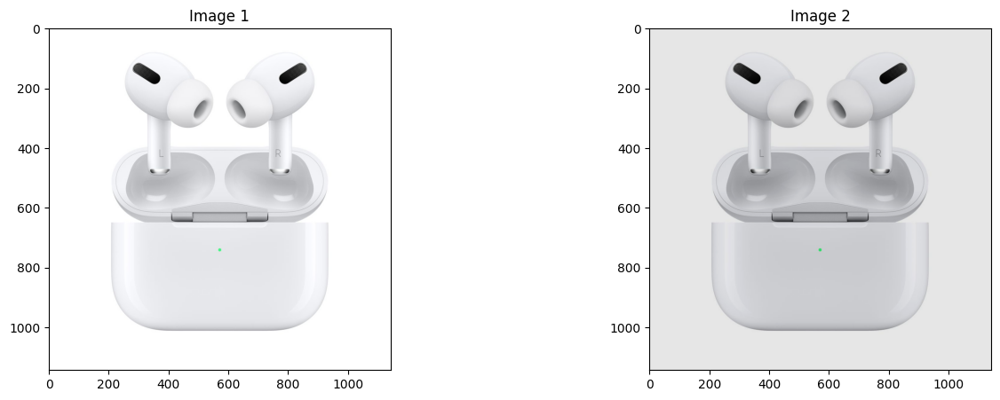

In [38]:
# gamma and gain parameters are between 0 and 1
adjusted_gamma_image = exposure.adjust_gamma(image_color, gamma=1.2, gain=0.9)
ShowTwoImages(image_color, adjusted_gamma_image)

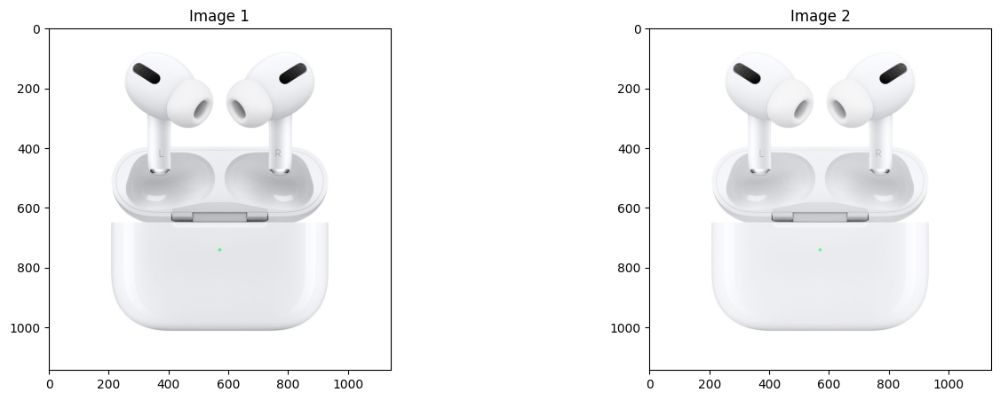

In [39]:
# Logarithmic corrected
log_correction_image = exposure.adjust_log(image_color)

ShowTwoImages(image_color, log_correction_image)